# Notebook 2: Generate Residence Centroids, determine `d1` and visualize centroids and nearest OSMNx nodes

## Introduction to Notebook 2

Our goal within the next three notebooks is to derive the values of three distances from the:
1. `d1` - distance between a Parish residence centroid and the closest OSMNx node
2. `d2` - distance between a testing facility and the closest OSMNx node
3. `d3` - the shortest distance (and route) between the OSMNx nodes (parish residence and testing facility)

<img src="images/d1-d2-d3.jpeg" alt="d1-d2-d3 image" width="700"/>

## Data sources for this notebook

### Data Source: GADM

Download page: https://gadm.org/download_country_v3.html  Use GeoPackage link.

What is GeoPackage? https://www.geopackage.org/

### Download Uganda geopackage

In [1]:
import os

In [2]:
if not os.path.exists('data/gadm36_UGA.gpkg'):
    if not os.path.exists('data/gadm_gpkg.zip'):
        os.system('wget https://biogeo.ucdavis.edu/data/gadm3.6/gpkg/gadm36_UGA_gpkg.zip -O data/gadm_gpkg.zip')
    os.system('unzip data/gadm_gpkg.zip -d data')

### Load Uganda GeoPackage as a GeoPandas GeoDataFrame (GDF)

What is GeoPandas? https://geopandas.org/

What is the difference between Pandas and GeoPandas?

What is GADM? https://gadm.org/

In [3]:
import geopandas as gpd, pandas as pd

pd.options.display.float_format = '{:.10f}'.format

In [4]:
uganda_gdf = gpd.read_file('data/gadm36_UGA.gpkg')

uganda_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5341 entries, 0 to 5340
Data columns (total 15 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   GID_0      5341 non-null   object  
 1   NAME_0     5341 non-null   object  
 2   GID_1      5341 non-null   object  
 3   NAME_1     5341 non-null   object  
 4   GID_2      5341 non-null   object  
 5   NAME_2     5341 non-null   object  
 6   GID_3      5341 non-null   object  
 7   NAME_3     5341 non-null   object  
 8   GID_4      5341 non-null   object  
 9   NAME_4     5341 non-null   object  
 10  VARNAME_4  0 non-null      object  
 11  TYPE_4     5341 non-null   object  
 12  ENGTYPE_4  5341 non-null   object  
 13  CC_4       0 non-null      object  
 14  geometry   5341 non-null   geometry
dtypes: geometry(1), object(14)
memory usage: 626.0+ KB


<AxesSubplot:>

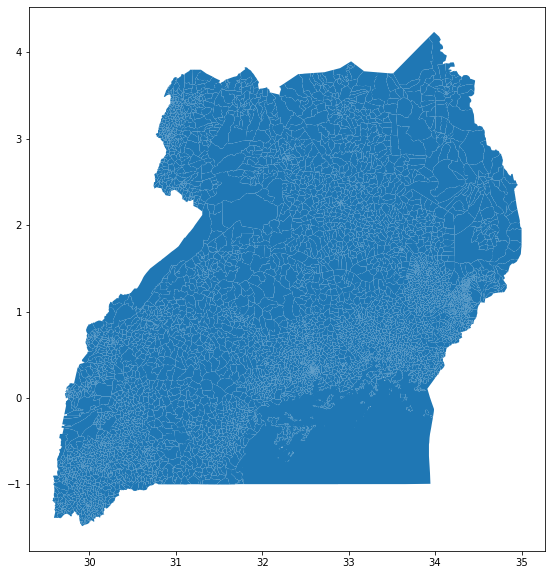

In [5]:
uganda_gdf.plot(figsize=(20, 10))

### Select a parish to study

In [65]:
parishes_gdf = uganda_gdf[uganda_gdf['NAME_1']=='Kampala'].copy()

In [66]:
parishes_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [67]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


In [153]:
parishes_gdf['area_sqm'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].area

In [154]:
parishes_gdf['centroid_x'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].centroid.x
parishes_gdf['centroid_y'] = parishes_gdf.to_crs(proj_epsg_str)['geometry'].centroid.y

In [155]:
parishes_gdf

,GID_0,NAME_0,GID_1,NAME_1,GID_2,NAME_2,GID_3,NAME_3,GID_4,NAME_4,VARNAME_4,TYPE_4,ENGTYPE_4,CC_4,geometry,centroid_x,centroid_y,area_sqm
1391,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.1_1,Bukesa,None,Parish,Parish,None,"MULTIPOLYGON (((32.56321 0.31958, 32.56292 0.3...",451524.4166484834,35906.9724917396,559768.3975113713
1392,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.2_1,Civic Centre,None,Parish,Parish,None,"MULTIPOLYGON (((32.57724 0.30992, 32.57730 0.3...",453884.4876301024,34880.4453069278,1209455.8146584462
1393,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.3_1,Industrial Area,None,Parish,Parish,None,"MULTIPOLYGON (((32.60664 0.31585, 32.60598 0.3...",455890.3457818956,35463.5391795589,1776410.1888784864
1394,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.4_1,Kagugube,None,Parish,Parish,None,"MULTIPOLYGON (((32.57084 0.32427, 32.57058 0.3...",452030.8561209833,36273.6179740557,502708.6719317246
1395,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.1_1,Central Division,UGA.16.1.1.5_1,Kamwokya I,None,Parish,Parish,None,"MULTIPOLYGON (((32.58500 0.34132, 32.58651 0.3...",454564.2625147337,38168.9266840896,411428.6768850113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1482,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.9_1,Nakulabye,None,Parish,Parish,None,"MULTIPOLYGON (((32.54860 0.33223, 32.55151 0.3...",450559.2039879204,36410.2678852486,1026084.8535207562
1483,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.10_1,Namirembe,None,Parish,Parish,None,"MULTIPOLYGON (((32.56114 0.30923, 32.56108 0.3...",450911.3264704964,35032.9390910053,1859599.6021243404
1484,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.11_1,Nateete,None,Parish,Parish,None,"MULTIPOLYGON (((32.54007 0.30528, 32.53991 0.3...",448176.4503960741,33820.1469633023,1804795.3528157366
1485,UGA,Uganda,UGA.16_1,Kampala,UGA.16.1_1,Kampala,UGA.16.1.5_1,Rubaga Division,UGA.16.1.5.12_1,Ndeeba,None,Parish,Parish,None,"MULTIPOLYGON (((32.57188 0.29548, 32.57166 0.2...",451649.7161646702,33182.2916360861,1962463.6518844874


In [11]:
parishes_polygon = parishes_gdf.geometry.unary_union

parishes_coords = (parishes_polygon.centroid.y, parishes_polygon.centroid.x)

In [12]:
parishes_coords

(0.32245219939201997, 32.59300521351633)

### Folium parish explorer

In [13]:
import folium

from folium import plugins

m = folium.Map(location=parishes_coords, zoom_start=14, control_scale=True)

for _, r in parishes_gdf.iterrows():
    # Simplify the representation of the parishes
    #    so the polygons display easily
    sim_geo = gpd.GeoSeries(r['geometry']).simplify(tolerance=0.000001)
    # convert the simplified geometry to GeoJSON
    geo_j = sim_geo.to_json()
    geo_j = folium.GeoJson(data=geo_j,
                           style_function=lambda x: {'color':'black','weight':2, 'fillColor': 'orange','fillOpacity':0.05},
                           highlight_function=lambda x: {'color':'black','weight':2, 'fillColor': 'blue','fillOpacity':0.075})
    folium.Popup('Parish: '+r['NAME_4']+'<br/>'+'Area (sq. m.): '+str(r['area_sqm'])).add_to(geo_j)
    geo_j.add_to(m)
    
m

### Create bounding parish polygon

In this section we will create the bounding parish polygon to enable us to create the data set that includes OSM building footprints for that parish. Downloading all building footprints for all parishes would consume a lot of resources (RAM) - for this initial exploration we will focus on one parish.

Parishes to try:
1. Kisugu (200+ residential units)
2. Bwaise I (1000+ residential units)
3. Bukasa (1300+ residential units)
4. Kawempe I (2500+ residential units)
5. Kazo Ward (3600+ residential units)

How many parishes are there in Kampala?

### Use IPython interactive widget for selection of target parish

In [157]:
from IPython.display import *
from ipywidgets import *

def f(parish_list):
    return parish_list

w = interactive(f, parish_list=parishes_gdf['NAME_4'].sort_values())
display(w)

interactive(children=(Dropdown(description='parish_list', options=('Banda', 'Bogolobi', 'Bukasa', 'Bukesa', 'B…

Let's store the widget result to `parish_name`.

In [240]:
parish_name = w.result

parish_name

'Bogolobi'

In [241]:
parish_gdf = parishes_gdf[parishes_gdf['NAME_4']==parish_name].copy()

In [242]:
parish_polygon = parish_gdf['geometry'].unary_union

In [243]:
type(parish_polygon)

shapely.geometry.polygon.Polygon

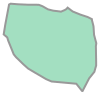

In [244]:
parish_polygon

In [245]:
parish_json = gpd.GeoSeries([parish_polygon]).__geo_interface__

In [246]:
parish_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Process OSMNx building footprints

### Set up OSMNx and Overpass API

What is OSMNx?

What is the Overpass API?

In [247]:
import osmnx as ox, csv, os

with open('overpass-api.csv', mode='r') as infile:
    reader = csv.reader(infile)
    overpass_api = {rows[0]:rows[1] for rows in reader}

ox.config(
    log_console=False, 
    use_cache=True, 
    log_file=True,
    overpass_endpoint=overpass_api['main']
)

### OSMNx building footprints in GeoPandas GeoDataFrame

References: 
1. OSMNx geometries from polygon: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_polygon
2. Open Street Map data model (nodes, ways, relations): https://labs.mapbox.com/mapping/osm-data-model/

In [248]:
# check if footprints_gdf exists:
if os.path.exists('data/footprints_gdf.gpkg'):
    footprints_gdf = gpd.read_file('data/footprints_gdf.gpkg')
else:
    footprints_gdf = gpd.GeoDataFrame()

if (footprints_gdf.empty) or (parish_name not in footprints_gdf['parish_name'].values):
    new_gdf = ox.geometries.geometries_from_polygon(parish_polygon, tags={'building':True}).reset_index()
    if 'nodes' in new_gdf.columns:
        new_gdf['nodes'] = new_gdf['nodes'].astype(str)
    if 'ways' in new_gdf.columns:
        new_gdf['ways'] = new_gdf['ways'].astype(str)
    new_gdf['parish_name'] = parish_name
    footprints_gdf = footprints_gdf.append(new_gdf, ignore_index=True)
    footprints_gdf.to_file('data/footprints_gdf.gpkg', driver='GPKG')

In [249]:
footprints_gdf['parish_name'].unique()

array(['Kisugu', 'Kasubi', 'Mutungo', 'Bukasa', 'Kibuye I', 'Ggaba',
       'Kabowa', 'Kawempe I', 'Bogolobi'], dtype=object)

### Using GeoPandas `explore()` (Folium Map)

Reference: https://geopandas.org/docs/user_guide/interactive_mapping.html

In [250]:
footprints_gdf[footprints_gdf['parish_name']==parish_name].explore()

### Select GeoDataFrame columns to use

In [251]:
filtered_buildings_gdf = footprints_gdf[footprints_gdf['parish_name']==parish_name][['parish_name','building','geometry']].copy()

### Select residential building types

What are building types in OSM? https://wiki.openstreetmap.org/wiki/Key:building

Let's look at the building types in this GDF.

In [252]:
filtered_buildings_gdf['building'].unique()

array(['yes', 'industrial', 'house', 'hospital', 'roof', 'residential',
       'retail', 'terrace', 'hotel', 'apartments', 'commercial',
       'construction', 'cabin'], dtype=object)

Add anything new in the list above that looks like a residential unit to the `include_list` below. The building type `yes` are for untagged buildings - learn more about it from this page: https://wiki.openstreetmap.org/wiki/Tag:building%3Dyes. Note there may be misspelled terms.

In [253]:
include_list = ['residential', 'dormitory', 'duplex', 'apartments', 'apartment', 'house', \
                'Tent', 'tent', 'semidetached_house', 'bungalow', 'detached', 'terrace', \
                'hut','settlment']

If you include `yes` in the `include list` below, this will potentially include untagged commercial and other non-residential type buildings.

In [254]:
%%time

include_yes = False
if include_yes:
    residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list + ['yes'])].copy()
    print('Records with "yes" building type:')
    print(residential_gdf.shape[0])
else:
    residential_gdf = filtered_buildings_gdf[filtered_buildings_gdf['building'].isin(include_list)].copy()
    print('Records without "yes" building type:')
    print(residential_gdf.shape[0])

Records without "yes" building type:
75
CPU times: user 2.88 ms, sys: 0 ns, total: 2.88 ms
Wall time: 2.44 ms


Let's clear some variables and recover memory resources. After this step `footprints_gdf` can no longer be used.

In [255]:
if 'footprints_gdf' in globals():
    del footprints_gdf 

In [256]:
residential_gdf.explore()

In [257]:
residential_gdf

,parish_name,building,geometry
82615,Bogolobi,house,"POLYGON ((32.61895 0.31925, 32.61901 0.31925, ..."
82625,Bogolobi,house,"POLYGON ((32.61845 0.32108, 32.61841 0.32103, ..."
82630,Bogolobi,residential,"POLYGON ((32.61984 0.31971, 32.61985 0.31971, ..."
82637,Bogolobi,residential,"POLYGON ((32.61948 0.31999, 32.61965 0.31989, ..."
82640,Bogolobi,residential,"POLYGON ((32.61888 0.30931, 32.61895 0.30940, ..."
...,...,...,...
83738,Bogolobi,house,"POLYGON ((32.62297 0.30948, 32.62306 0.30944, ..."
83743,Bogolobi,house,"POLYGON ((32.62210 0.30877, 32.62211 0.30879, ..."
83744,Bogolobi,house,"POLYGON ((32.62183 0.30890, 32.62192 0.30893, ..."
83745,Bogolobi,house,"POLYGON ((32.62270 0.30850, 32.62275 0.30859, ..."


In [258]:
residential_gdf.reset_index(inplace=True, drop=True)

residential_gdf

,parish_name,building,geometry
0,Bogolobi,house,"POLYGON ((32.61895 0.31925, 32.61901 0.31925, ..."
1,Bogolobi,house,"POLYGON ((32.61845 0.32108, 32.61841 0.32103, ..."
2,Bogolobi,residential,"POLYGON ((32.61984 0.31971, 32.61985 0.31971, ..."
3,Bogolobi,residential,"POLYGON ((32.61948 0.31999, 32.61965 0.31989, ..."
4,Bogolobi,residential,"POLYGON ((32.61888 0.30931, 32.61895 0.30940, ..."
...,...,...,...
70,Bogolobi,house,"POLYGON ((32.62297 0.30948, 32.62306 0.30944, ..."
71,Bogolobi,house,"POLYGON ((32.62210 0.30877, 32.62211 0.30879, ..."
72,Bogolobi,house,"POLYGON ((32.62183 0.30890, 32.62192 0.30893, ..."
73,Bogolobi,house,"POLYGON ((32.62270 0.30850, 32.62275 0.30859, ..."


### Set CRS to EPSG:4326

Why is it important to set a CRS for a GeoDataFrame (GDF)? https://geopandas.org/docs/user_guide/projections.html

In [259]:
residential_gdf.to_crs('EPSG:4326')

,parish_name,building,geometry
0,Bogolobi,house,"POLYGON ((32.61895 0.31925, 32.61901 0.31925, ..."
1,Bogolobi,house,"POLYGON ((32.61845 0.32108, 32.61841 0.32103, ..."
2,Bogolobi,residential,"POLYGON ((32.61984 0.31971, 32.61985 0.31971, ..."
3,Bogolobi,residential,"POLYGON ((32.61948 0.31999, 32.61965 0.31989, ..."
4,Bogolobi,residential,"POLYGON ((32.61888 0.30931, 32.61895 0.30940, ..."
...,...,...,...
70,Bogolobi,house,"POLYGON ((32.62297 0.30948, 32.62306 0.30944, ..."
71,Bogolobi,house,"POLYGON ((32.62210 0.30877, 32.62211 0.30879, ..."
72,Bogolobi,house,"POLYGON ((32.62183 0.30890, 32.62192 0.30893, ..."
73,Bogolobi,house,"POLYGON ((32.62270 0.30850, 32.62275 0.30859, ..."


### Obtain Residence Centroids

What is a centroid? 

In [260]:
residential_centroids_gdf = residential_gdf.copy()

In [261]:
residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].centroid

residential_centroids_gdf

/tmp/ipykernel_9847/1830439308.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['geometry'] = residential_centroids_gdf['geometry'].centroid


,parish_name,building,geometry
0,Bogolobi,house,POINT (32.61897 0.31920)
1,Bogolobi,house,POINT (32.61846 0.32098)
2,Bogolobi,residential,POINT (32.61990 0.31967)
3,Bogolobi,residential,POINT (32.61954 0.31990)
4,Bogolobi,residential,POINT (32.61902 0.30927)
...,...,...,...
70,Bogolobi,house,POINT (32.62307 0.30950)
71,Bogolobi,house,POINT (32.62211 0.30884)
72,Bogolobi,house,POINT (32.62191 0.30898)
73,Bogolobi,house,POINT (32.62263 0.30861)


In [262]:
residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x

residential_centroids_gdf

/tmp/ipykernel_9847/3520687935.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lat'] = residential_centroids_gdf.centroid.y
/tmp/ipykernel_9847/3520687935.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  residential_centroids_gdf['lon'] = residential_centroids_gdf.centroid.x


,parish_name,building,geometry,lat,lon
0,Bogolobi,house,POINT (32.61897 0.31920),0.3191977847,32.6189717231
1,Bogolobi,house,POINT (32.61846 0.32098),0.3209799009,32.6184635649
2,Bogolobi,residential,POINT (32.61990 0.31967),0.3196704842,32.6199031699
3,Bogolobi,residential,POINT (32.61954 0.31990),0.3199041172,32.6195426016
4,Bogolobi,residential,POINT (32.61902 0.30927),0.3092665121,32.6190195079
...,...,...,...,...,...
70,Bogolobi,house,POINT (32.62307 0.30950),0.3095040820,32.6230707737
71,Bogolobi,house,POINT (32.62211 0.30884),0.3088400784,32.6221111100
72,Bogolobi,house,POINT (32.62191 0.30898),0.3089791859,32.6219113277
73,Bogolobi,house,POINT (32.62263 0.30861),0.3086109190,32.6226345365


In [263]:
residential_centroids_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

## Create analysis columns

### Create projected lat/lon columns

In [264]:
import yaml

with open("proj_crs.yml", "r") as stream:
    try:
        epsg_dict = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)
        
proj_epsg_str = str(epsg_dict).replace("{","").replace("}", "").replace("'","").replace(" ","")

print('Projected graph EPSG code:',proj_epsg_str)

Projected graph EPSG code: EPSG:32636


Reference for 32636: https://epsg.io/32636

In [265]:
residential_centroids_proj_gdf = residential_centroids_gdf.to_crs(proj_epsg_str)

residential_centroids_proj_gdf.crs

<Projected CRS: EPSG:32636>
Name: WGS 84 / UTM zone 36N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Between 30°E and 36°E, northern hemisphere between equator and 84°N, onshore and offshore. Belarus. Cyprus. Egypt. Ethiopia. Finland. Israel. Jordan. Kenya. Lebanon. Moldova. Norway. Russian Federation. Saudi Arabia. Sudan. Syria. Turkey. Uganda. Ukraine.
- bounds: (30.0, 0.0, 36.0, 84.0)
Coordinate Operation:
- name: UTM zone 36N
- method: Transverse Mercator
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [266]:
residential_centroids_proj_gdf

,parish_name,building,geometry,lat,lon
0,Bogolobi,house,POINT (457601.432 35281.735),0.3191977847,32.6189717231
1,Bogolobi,house,POINT (457544.893 35478.719),0.3209799009,32.6184635649
2,Bogolobi,residential,POINT (457705.081 35333.980),0.3196704842,32.6199031699
3,Bogolobi,residential,POINT (457664.959 35359.805),0.3199041172,32.6195426016
4,Bogolobi,residential,POINT (457606.709 34184.006),0.3092665121,32.6190195079
...,...,...,...,...,...
70,Bogolobi,house,POINT (458057.518 34210.249),0.3095040820,32.6230707737
71,Bogolobi,house,POINT (457950.728 34136.859),0.3088400784,32.6221111100
72,Bogolobi,house,POINT (457928.497 34152.236),0.3089791859,32.6219113277
73,Bogolobi,house,POINT (458008.971 34111.527),0.3086109190,32.6226345365


In [267]:
residential_centroids_proj_gdf['prj_lat'] = residential_centroids_proj_gdf.geometry.y
residential_centroids_proj_gdf['prj_lon'] = residential_centroids_proj_gdf.geometry.x

In [268]:
residential_centroids_proj_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon
0,Bogolobi,house,POINT (457601.432 35281.735),0.3191977847,32.6189717231,35281.7349395209,457601.4315431911
1,Bogolobi,house,POINT (457544.893 35478.719),0.3209799009,32.6184635649,35478.7188727553,457544.8931965232
2,Bogolobi,residential,POINT (457705.081 35333.980),0.3196704842,32.6199031699,35333.9797747911,457705.0808807934
3,Bogolobi,residential,POINT (457664.959 35359.805),0.3199041172,32.6195426016,35359.8053009488,457664.9593515809
4,Bogolobi,residential,POINT (457606.709 34184.006),0.3092665121,32.6190195079,34184.0059629313,457606.7087959010
...,...,...,...,...,...,...,...
70,Bogolobi,house,POINT (458057.518 34210.249),0.3095040820,32.6230707737,34210.2490542728,458057.5175806581
71,Bogolobi,house,POINT (457950.728 34136.859),0.3088400784,32.6221111100,34136.8588826989,457950.7276417547
72,Bogolobi,house,POINT (457928.497 34152.236),0.3089791859,32.6219113277,34152.2355729518,457928.4972558244
73,Bogolobi,house,POINT (458008.971 34111.527),0.3086109190,32.6226345365,34111.5272534461,458008.9714464403


In [269]:
residential_centroids_4326_gdf = residential_centroids_proj_gdf.to_crs('EPSG:4326')

residential_centroids_4326_gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [270]:
residential_centroids_4326_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon
0,Bogolobi,house,POINT (32.61897 0.31920),0.3191977847,32.6189717231,35281.7349395209,457601.4315431911
1,Bogolobi,house,POINT (32.61846 0.32098),0.3209799009,32.6184635649,35478.7188727553,457544.8931965232
2,Bogolobi,residential,POINT (32.61990 0.31967),0.3196704842,32.6199031699,35333.9797747911,457705.0808807934
3,Bogolobi,residential,POINT (32.61954 0.31990),0.3199041172,32.6195426016,35359.8053009488,457664.9593515809
4,Bogolobi,residential,POINT (32.61902 0.30927),0.3092665121,32.6190195079,34184.0059629313,457606.7087959010
...,...,...,...,...,...,...,...
70,Bogolobi,house,POINT (32.62307 0.30950),0.3095040820,32.6230707737,34210.2490542728,458057.5175806581
71,Bogolobi,house,POINT (32.62211 0.30884),0.3088400784,32.6221111100,34136.8588826989,457950.7276417547
72,Bogolobi,house,POINT (32.62191 0.30898),0.3089791859,32.6219113277,34152.2355729518,457928.4972558244
73,Bogolobi,house,POINT (32.62263 0.30861),0.3086109190,32.6226345365,34111.5272534461,458008.9714464403


In [271]:
%%time
if 'G_proj' not in globals():
    G_proj = ox.load_graphml('data/g_projected.graphml')

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.25 µs


### Compute d1 and euclidean distance between origin point for residence centroid and OSMNx node

References:
1. OSMNx Distance - Nearest Nodes: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.nearest_nodes
2. OSMNx Distance - Vectorized Euclidean Distance: https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.distance.euclidean_dist_vec
2. tqdm: https://github.com/tqdm/tqdm

The Python code below may take a few minutes (200+ residential units) to an hour or more (3000+ residential units) to complete.

In [272]:
%%time

from tqdm import tqdm, notebook

residential_centroids_4326_gdf['r_node'] = 0
residential_centroids_4326_gdf['r_node_lat'] = 0.0
residential_centroids_4326_gdf['r_node_lon'] = 0.0
residential_centroids_4326_gdf['r_node_y'] = 0.0
residential_centroids_4326_gdf['r_node_x'] = 0.0
residential_centroids_4326_gdf['d1'] = 0.0
residential_centroids_4326_gdf['d1_euc'] = 0.0

# tqdm parameters
total_rows=residential_centroids_4326_gdf.shape[0]

for index, r_row in tqdm(residential_centroids_4326_gdf.iterrows(), total=total_rows):
    r_node, d1 = ox.distance.nearest_nodes(G_proj, r_row['prj_lon'], r_row['prj_lat'], return_dist=True)
    r_node_y = G_proj.nodes[r_node]['y']
    r_node_x = G_proj.nodes[r_node]['x']
    r_node_lat = G_proj.nodes[r_node]['lat']
    r_node_lon = G_proj.nodes[r_node]['lon']
    d1_euc = ox.distance.euclidean_dist_vec(r_row['prj_lat'], r_row['prj_lon'], r_node_y, r_node_x)
    residential_centroids_4326_gdf.loc[index, 'r_node'] = r_node
    residential_centroids_4326_gdf.loc[index, 'r_node_lat'] = r_node_lat
    residential_centroids_4326_gdf.loc[index, 'r_node_lon'] = r_node_lon
    residential_centroids_4326_gdf.loc[index, 'r_node_y'] = r_node_y
    residential_centroids_4326_gdf.loc[index, 'r_node_x'] = r_node_x
    residential_centroids_4326_gdf.loc[index, 'd1'] = d1
    residential_centroids_4326_gdf.loc[index, 'd1_euc'] = d1_euc

    r_dict = {'r_lat':r_row['lat'], 'r_lon':r_row['lon'], 'r_node':r_node, \
              'r_node_lat':r_node_lat, 'r_node_lon':r_node_lon, \
              'r_node_y':r_node_y, 'r_node_x':r_node_x, 'd1':d1, 'd1_euc': d1_euc}
    
    #print(r_dict)

100%|██████████| 75/75 [00:57<00:00,  1.31it/s]

CPU times: user 57.5 s, sys: 72.1 ms, total: 57.5 s
Wall time: 57.4 s


In [273]:
residential_centroids_4326_gdf['r_node'] = residential_centroids_4326_gdf['r_node'].astype(int)

residential_centroids_4326_gdf

,parish_name,building,geometry,lat,lon,prj_lat,prj_lon,r_node,r_node_lat,r_node_lon,r_node_y,r_node_x,d1,d1_euc
0,Bogolobi,house,POINT (32.61897 0.31920),0.3191977847,32.6189717231,35281.7349395209,457601.4315431911,5550931521,0.3191909000,32.6190589000,35280.9735925005,457611.1321833385,9.7304711373,9.7304711373
1,Bogolobi,house,POINT (32.61846 0.32098),0.3209799009,32.6184635649,35478.7188727553,457544.8931965232,8154284336,0.3208495000,32.6183599000,35464.3057621130,457533.3572698800,18.4611852790,18.4611852790
2,Bogolobi,residential,POINT (32.61990 0.31967),0.3196704842,32.6199031699,35333.9797747911,457705.0808807934,3566123483,0.3194568000,32.6199076000,35310.3606978363,457705.5729720230,23.6242026316,23.6242026316
3,Bogolobi,residential,POINT (32.61954 0.31990),0.3199041172,32.6195426016,35359.8053009488,457664.9593515809,579895938,0.3196332000,32.6194710000,35329.8604349669,457656.9907180882,30.9869991838,30.9869991838
4,Bogolobi,residential,POINT (32.61902 0.30927),0.3092665121,32.6190195079,34184.0059629313,457606.7087959010,1730372794,0.3093669000,32.6192477000,34195.1011767599,457632.1014579641,27.7108472724,27.7108472724
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,Bogolobi,house,POINT (32.62307 0.30950),0.3095040820,32.6230707737,34210.2490542728,458057.5175806581,613012858,0.3096139000,32.6232576000,34222.3867739213,458078.3072551460,24.0735291052,24.0735291052
71,Bogolobi,house,POINT (32.62211 0.30884),0.3088400784,32.6221111100,34136.8588826989,457950.7276417547,6224219294,0.3090265000,32.6217180000,34157.4660811568,457906.9847488915,48.3538757942,48.3538757942
72,Bogolobi,house,POINT (32.62191 0.30898),0.3089791859,32.6219113277,34152.2355729518,457928.4972558244,6224219294,0.3090265000,32.6217180000,34157.4660811568,457906.9847488915,22.1392450328,22.1392450328
73,Bogolobi,house,POINT (32.62263 0.30861),0.3086109190,32.6226345365,34111.5272534461,458008.9714464403,579895550,0.3080507000,32.6231617000,34049.6027725653,458067.6297831680,85.2962003844,85.2962003844


## Map Residence Centroids and OSMNx nodes

What is folium? https://python-visualization.github.io/folium/

In [274]:
import folium
from folium import plugins

map1 = residential_centroids_4326_gdf.explore(
    marker_kwds=dict(radius=5))

# Tile Layer (can add more, these become radio buttons on Layer Control)
folium.TileLayer('cartodbpositron').add_to(map1)

# Feature groups become checkboxes in Layer Control Widget
fg0=folium.FeatureGroup(name='Parish Boundary', show=False)
fg1=folium.FeatureGroup(name='Residences', show=False)
fg2=folium.FeatureGroup(name='Residence Nodes', show=False)
fg3=folium.FeatureGroup(name='Residence to Node', show=False)

# GeoJSON parish boundary with style function
style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0, 
                            'weight': 3}
folium.GeoJson(
    data=parish_gdf['geometry'], 
    name="geojson",
    style_function=style_function
).add_to(fg0)

# Residences, Nodes and Residence-to-Node Paths
for index,row in residential_centroids_4326_gdf.iterrows():

    folium.CircleMarker(
                    location=[row['lat'],row['lon']], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='red', \
                    fill_opacity=1).add_to(fg1)


    folium.CircleMarker(
                    location=[row['r_node_lat'],row['r_node_lon']], \
                    radius=4, \
                    color='black', \
                    weight=1, \
                    fill=True, \
                    fill_color='yellow', \
                    fill_opacity=1).add_to(fg2)
    
    r_line_points = ((row['lat'],row['lon']),(row['r_node_lat'],row['r_node_lon']))
    popup_d1 = folium.Popup(str(row['d1'])+' meters')
    folium.PolyLine(r_line_points,
                    color='gray',
                    popup=popup_d1,
                    weight=2,
                    opacity=0.8
                   ).add_to(fg3)

fg0.add_to(map1)
fg1.add_to(map1)
fg2.add_to(map1)
fg3.add_to(map1)

# Layer Control
folium.LayerControl(position='topright', collapsed=True, autoZIndex=True).add_to(map1)

map1.add_child(plugins.MeasureControl())

# Full Screen button
plugins.Fullscreen(
    position='topright',
    title='Expand me',
    title_cancel='Exit me',
    force_separate_button=True
).add_to(map1)

map1

## Housecleaning

How do we save GeoDataFrames to disk?

In [275]:
residential_centroids_4326_gdf.to_file('data/residential_centroids_4326_gdf.gpkg', driver='GPKG')

In [276]:
if os.path.exists('data/residential_centroids_cache_gdf.gpkg'):
    residential_centroids_cache_gdf = gpd.read_file('data/residential_centroids_cache_gdf.gpkg')
else:
    residential_centroids_cache_gdf = gpd.GeoDataFrame()

if (residential_centroids_cache_gdf.empty) or (parish_name not in residential_centroids_cache_gdf['parish_name'].values):
    residential_centroids_cache_gdf = residential_centroids_cache_gdf.append(residential_centroids_4326_gdf, ignore_index=True)
    residential_centroids_cache_gdf.to_file('data/residential_centroids_cache_gdf.gpkg', driver='GPKG')

residential_centroids_cache_gdf['parish_name'].unique()

array(['Ggaba', 'Kisugu', 'Kabowa', 'Kawempe I', 'Bogolobi'], dtype=object)

In [277]:
uganda_gdf.to_file('data/uganda_gdf.gpkg', driver='GPKG')

In [278]:
parish_gdf.to_file('data/parish_gdf.gpkg', driver='GPKG')

In [279]:
parishes_gdf.to_file('data/parishes_gdf.gpkg', driver='GPKG')